# Image Processing 

## Synthèse des images bruitées

### Introduction
    dans cette partie du TP, l'objectif est la restauration d'image altérées par différents types de dégradation: 
    * Bruit additionnel gaussien ou impulsionnel 
    * Bruit Convolutif 
    * Bruit multiplicatif périodique
    Enutilisant les techniques spatiales ou spectrales, linéaires ou non linéaires

### the needed packages 

In [2]:
import numpy as np 
import matplotlib.pyplot as plt 
from PIL import Image 
from PIL import ImageFilter 
import timeit 
from skimage.util import random_noise
from skimage.metrics import peak_signal_noise_ratio as psnr 
%matplotlib inline 

the picture has 1153 lignes and 771 colonnes 
 your picture :


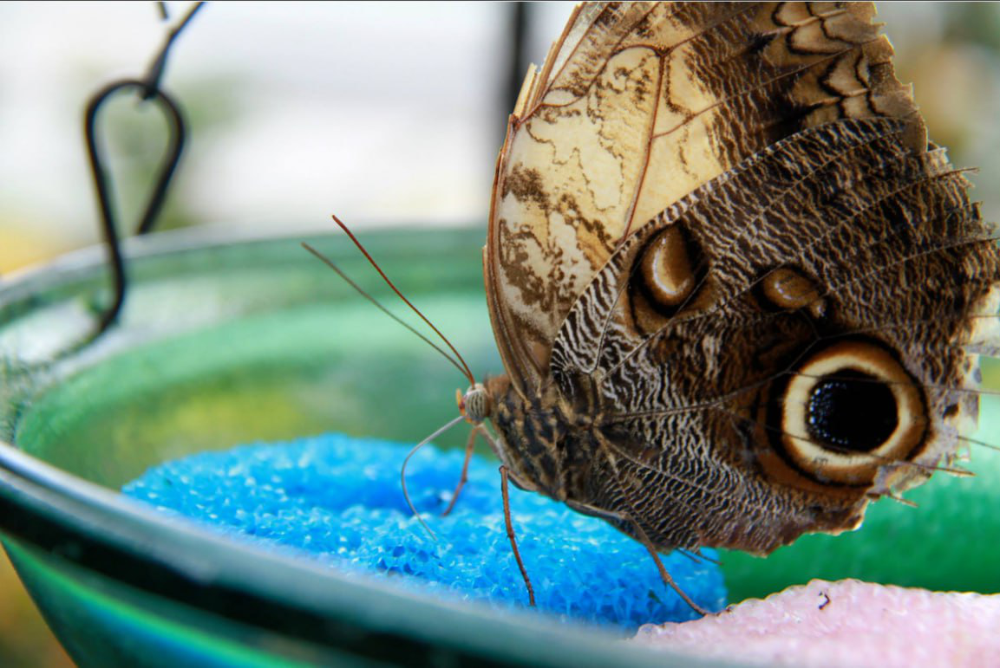

In [3]:
#chargement d'image dans la variable im 
im = Image.open("./pic.jpg")
im = im.convert('RGB')
N, M = im.size
print(f"the picture has {N} lignes and {M} colonnes \n" , "your picture :")
#l'affichage d'image a chargée 
im

## Generation des images dégradées

## Degradation par bruit aditionnel

#### Converting the image to a gray image using the rgb2gray () 


In [4]:
#rgb2gray using array based operations
def rgb2gray (image): 
    pic = image.split()
    #layer_r = np.array(image)[:, :, 0]
    #layer_g = np.array(image)[:, :, 1]
    #layer_b = np.array(image)[:, :, 2]
    pic = np.array(pic)
    L = np.uint8(0.299 *pic[0] + 0.587*pic[1] + 0.114*pic[2])
    L = Image.fromarray(L)
    return L 

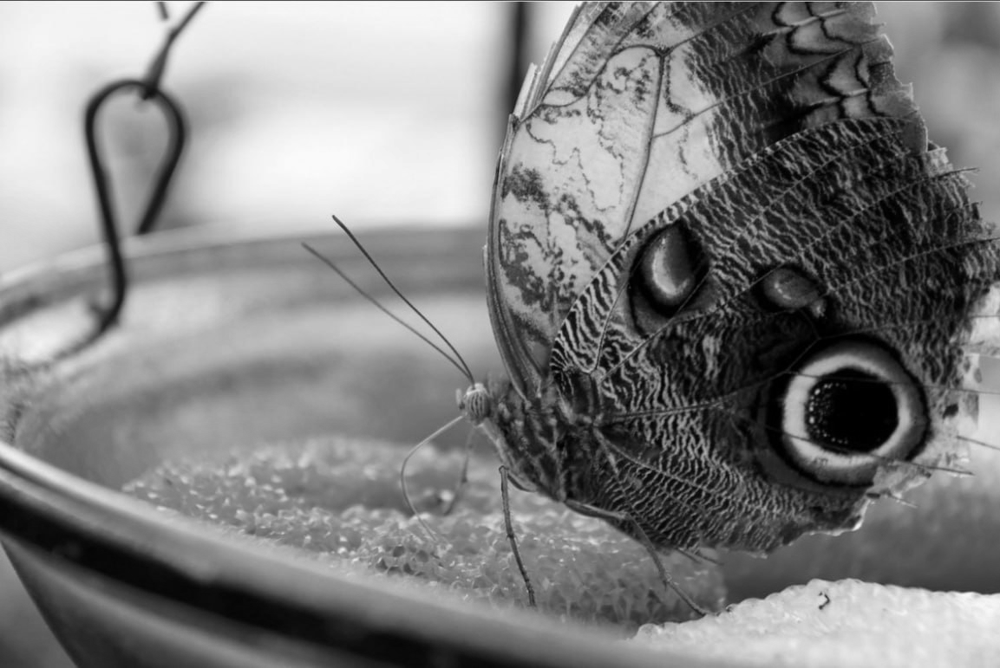

In [5]:
#affichage d'image de luminesence
rgb2gray(im)

In [6]:
#rgb2gray using pixel to pixel operations 
def rgb2gray2(im):
    out=Image.new("L",im.size)
    M,N=im.size
    for m in range(M):
        for n in range(N):
            p=im.getpixel((m,n))
            gray=int(p[0]*0.299+p[1]*0.587+p[2]*0.144)
            out.putpixel((m,n),gray)
            
    return out

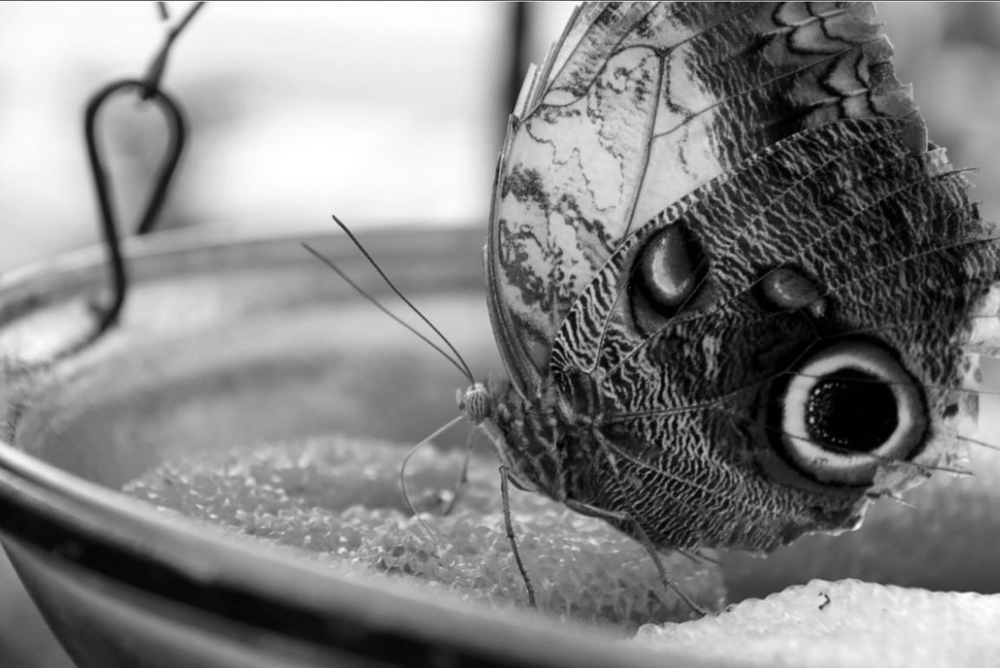

In [7]:
#affichage d'image de luminesence
rgb2gray2(im)

* comparing the performance between the two appraoches 

In [8]:
#time complexity of the first fun
def work (): 
    rgb2gray(im)
timeit.timeit ('work()', globals=globals(), number =1)

0.0788408000007621

In [9]:
#time complexity of the second fun
def work (): 
    rgb2gray2(im)
timeit.timeit ('work()', globals=globals(), number =1)

4.1185169000018504

* the first code is more efficient than the other

#### developing the imnoise() function that returns blured images using the additionnal noise : 
    * salt and pepper 
    * gaussian blur 

In [10]:
from random import choice
def imnoise ( image ,  noise_type , noise_param , show=False ):
    noisy_image= image.copy()
    n, m = image.size
    im_array = np.array(image)
    k = int (n*m* noise_param)
    a=np.random.randint(0, n-1, k)
    b=np.random.randint(0, m-1, k)
    z= zip(a , b)
        # salt noise replace the value of a random pix of the image with 255
    if noise_type == "s":
            for c in z:
                noisy_image.putpixel ( c , 255)
            
        # pepper noise replace the value of a random pix of the image with 0
    elif noise_type == "p":
        for c in z :
            noisy_image.putpixel ( c, 0)
            
        # salt& pepper noise replace the value of a random pix of the image randomply  with 255 or 0
    elif noise_type =="s&p":
        a=np.random.randint(0, n-1, k)
        b=np.random.randint(0, m-1, k)
        for c in z: 
            noise_value = choice([0, 255])
            noisy_image.putpixel(c, noise_value)
                
            #the gaussian noise, normal distribution 
        #to implement the guassian noise we will use the random.normal() fun from numpy 
    #  random.noraml()takes three main args : mean "0"; scale or standard deviation and the size of the image 
    #the standar deviation, stddev is calculated using the variance 
    elif noise_type == "gaussian": 
        #noise = np.zeros ((m,n))
        #stdev= np.sqrt(noise_param)
        noise = np.random.normal(0, noise_param, im_array.shape)
        noisy = im_array + noise
    
        noisy = np.clip(noisy, 0, 255)
        noisy= Image.fromarray(noisy.astype(np.uint8))
        noisy_image = noisy 
        
  
    if show: 
        image.show()
    else:
        return noisy_image

In [11]:
gray_image = rgb2gray(im.copy())

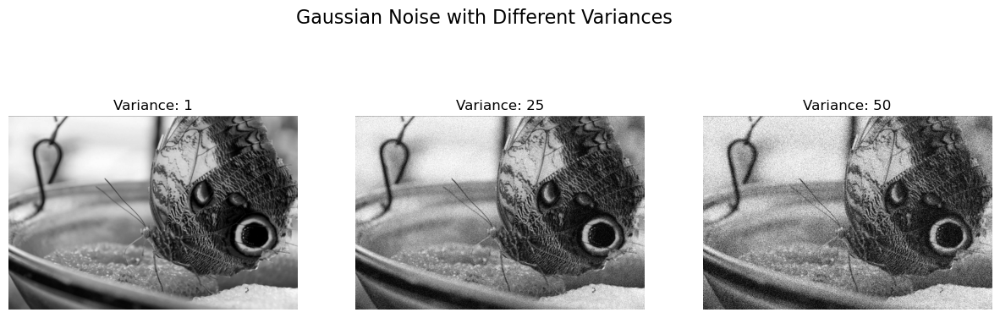

In [12]:
# applying the gaussian noise 
variance = [1 ,25,50]
blured_img_gauss = []
blured_img_gauss = [imnoise ( gray_image ,  'gaussian' , s, show= False ) for s in variance]

# Display the images in a single plot to compare the effect of the variance 
fig, axes = plt.subplots(1, len(blured_img_gauss), figsize=(15, 5))
fig.suptitle("Gaussian Noise with Different Variances", fontsize=16)

for ax, image, var in zip(axes, blured_img_gauss, variance):
    ax.imshow(image, cmap='gray') 
    ax.set_title(f"Variance: {var}")
    ax.axis('off') 

plt.show() 


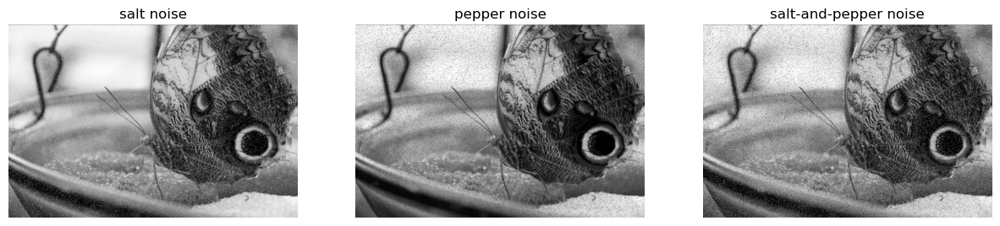

In [13]:
blured_salt_img = imnoise ( gray_image ,  's' , 0.05, show= False )

blured_pepper_img= imnoise ( gray_image,  'p' , 0.05, show= False )

blured_sandp_img= imnoise (gray_image,  's&p' , 0.1, show= False)

# Displaying the images with differentimpulsionnel noise 
fig, axes = plt.subplots(1, 3, figsize=(15, 5))  

titles = ["salt noise", "pepper noise", "salt-and-pepper noise"]
images = [blured_salt_img, blured_pepper_img, blured_sandp_img]

for ax, title, image in zip(axes, titles, images):
    ax.imshow(image, cmap='gray')
    ax.set_title(title) 
    ax.axis('off') 
    
plt.show()  


## Degradation par bruit Convolutive

In [14]:
def conv_blur( image , kernel ):
    N,M = image.size
    picf = np.zeros((M,N))
    for i in range(M):
        picf[i,:] = np.convolve(np.asarray(image)[i,:], kernel, "same")
    for j in range(N):
        picf[:,j] = np.convolve(picf[:,j], kernel, "same")
    img = picf.astype('uint8')
    blured_image =Image.fromarray(img)
    return blured_image

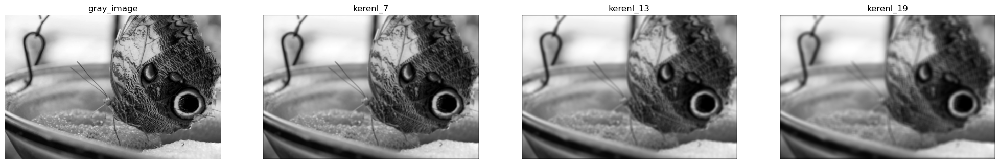

In [15]:
kernel_7 = 1/7*np.ones(7)
kernel_13 = 1/13*np.ones(13)
kernel_19 = 1/19*np.ones(19)
# generating the images with diffrent kernel size
picture_7= conv_blur ( gray_image , kernel_7 )
picture_13= conv_blur ( gray_image , kernel_13 )
picture_19= conv_blur ( gray_image , kernel_19 )

fig, axes = plt.subplots(1, 4, figsize=(25, 10))  

titles = ["gray_image", "kerenl_7", "kerenl_13", "kerenl_19"]
images = [gray_image, picture_7, picture_13, picture_19]

for ax, title, image in zip(axes, titles, images):
    ax.imshow(image, cmap='gray')
    ax.set_title(title) 
    ax.axis('off') 
    
plt.show()  


    when augmenting the kerenl size the smoothing effect of the convolutionnal becomes bigger (median filter) 

## Degradation par bruit Composé ( bruit additif + bruit convolutif)

In [16]:
#the kerenl for convolution processing
kernel = 1/15*np.ones(15)

In [17]:
# generation d'image bruitée par le bruit additif gaussien et le bruit conv 
gaussian_noisy_image= imnoise(gray_image, "gaussian", 15)
blurred_image_gc= conv_blur(gaussian_noisy_image, kernel)


In [18]:
# generation d'image bruitée par le bruit additif impulssionnel  et le bruit conv
sandp_noisy_image= imnoise(gray_image, 's&p', 0.08)
blurred_image_sp= conv_blur(sandp_noisy_image, kernel)

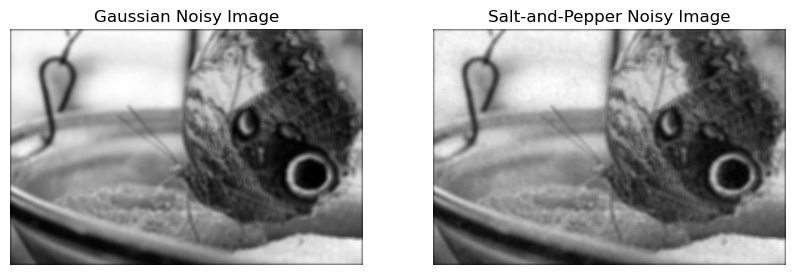

In [19]:
# Display the noisy and blurred images
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(blurred_image_gc, cmap='gray')
plt.title("Gaussian Noisy Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(blurred_image_sp, cmap='gray')
plt.title("Salt-and-Pepper Noisy Image")
plt.axis("off")

plt.show()  

## Degradation par bruit multiplicatif péridique 

In [20]:
a= 0.5
Px= Py = 15
offset = 1-a

In [21]:
# Generation des masques selon les deux directions 
x= np.arange(0, M)
y= np.arange (0,N)

mask_x= a*(1+np.cos(2*np.pi*x/Px))/2 +offset
mask_y= a*(1+np.cos(2*np.pi*y/Py))/2 +offset

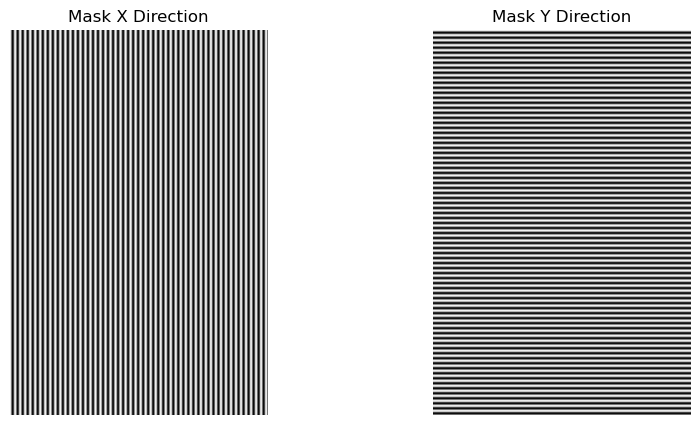

In [22]:
#affichage des deux masks 
mask_x, mask_y = np.meshgrid(mask_x, mask_y)

plt.figure(figsize=(10, 5)) 

plt.subplot(1, 2, 1)  
plt.imshow(mask_x, cmap='gray') 
plt.title("Mask X Direction")
plt.axis("off")  

plt.subplot(1, 2, 2)  
plt.imshow(mask_y, cmap='gray')  
plt.title("Mask Y Direction")
plt.axis("off")  

plt.show() 

In [23]:
# generons l'image bruité par ce bruit 
noisy_image_x = (np.array(gray_image)*mask_x.T).astype(np.uint8)
noisy_image_y = (np.array(gray_image)*mask_y.T).astype(np.uint8)


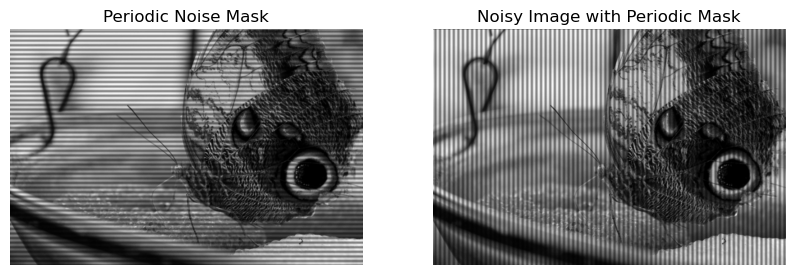

In [24]:
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(noisy_image_x , cmap='gray')
plt.title("Periodic Noise Mask")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(noisy_image_y, cmap='gray')
plt.title("Noisy Image with Periodic Mask")
plt.axis("off")

plt.show()

In [25]:
#calculons les spectres 
spectrum_x = np.fft.fftshift(np.fft.fft2(mask_x))  
spectrum_y = np.fft.fftshift(np.fft.fft2(mask_y))

amplitude_spectrum_x= np.log(np.abs(spectrum_x) + 1)  
amplitude_spectrum_y = np.log(np.abs(spectrum_y) + 1)


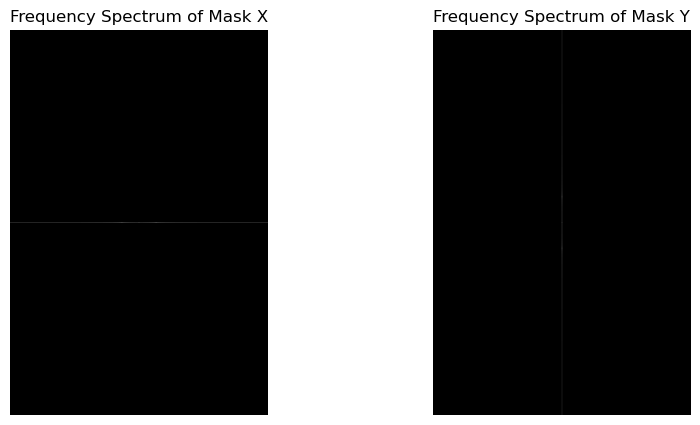

In [26]:
# affichage des spectres
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(amplitude_spectrum_x, cmap='gray')
plt.title("Frequency Spectrum of Mask X")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(amplitude_spectrum_y, cmap='gray')
plt.title("Frequency Spectrum of Mask Y")
plt.axis("off")

plt.show()

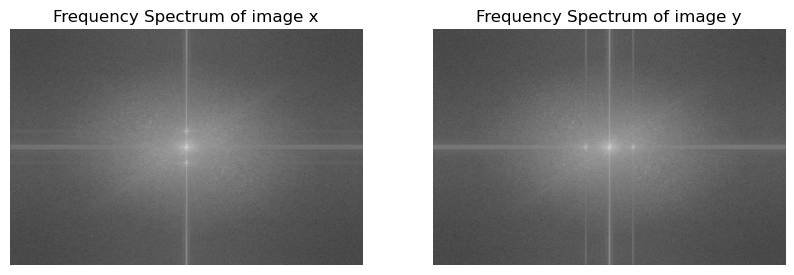

In [27]:
# spetres des images bruitées
spectrum_image_x = np.fft.fftshift(np.fft.fft2(noisy_image_x))
spectrum_image_y = np.fft.fftshift(np.fft.fft2(noisy_image_y))

amplitude_spectrum_image_x= np.log(np.abs(spectrum_image_x) + 1)
amplitude_spectrum_image_y= np.log(np.abs(spectrum_image_y) + 1)

# affichage des spectres
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(amplitude_spectrum_image_x, cmap='gray')
plt.title("Frequency Spectrum of image x")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(amplitude_spectrum_image_y, cmap='gray')
plt.title("Frequency Spectrum of image y")
plt.axis("off")

plt.show()

*coment*: mask_X creates horizontal stripes with periodicity along the X-axis, while mask_Y creates vertical stripes with periodicity along the Y-axis both are linear in pattern and lead to a  periodic noise in a single direction

In [28]:
P=25
X, Y = np.meshgrid(x, y)
mask_xaddy= a*(1+np.cos(2*np.pi*(X+Y)/P))/2 +offset

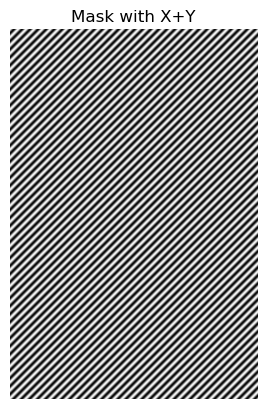

In [29]:
# affichage du mask 
plt.imshow(mask_xaddy, cmap='gray') 
plt.title("Mask with X+Y")
plt.axis("off") 
plt.show()

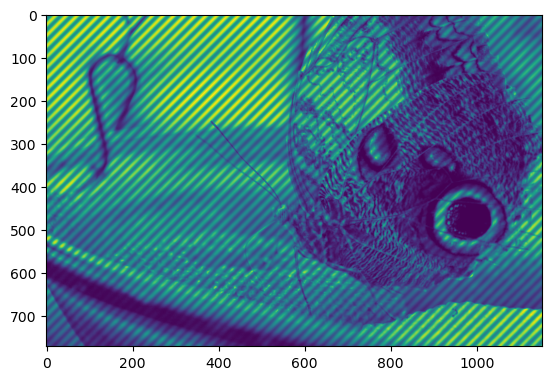

In [30]:
#generation d'image bruité mar le mask x+y
noisy_image_xaddy = (np.array(gray_image)*mask_xaddy.T).astype(np.uint8)
plt.imshow(noisy_image_xaddy)

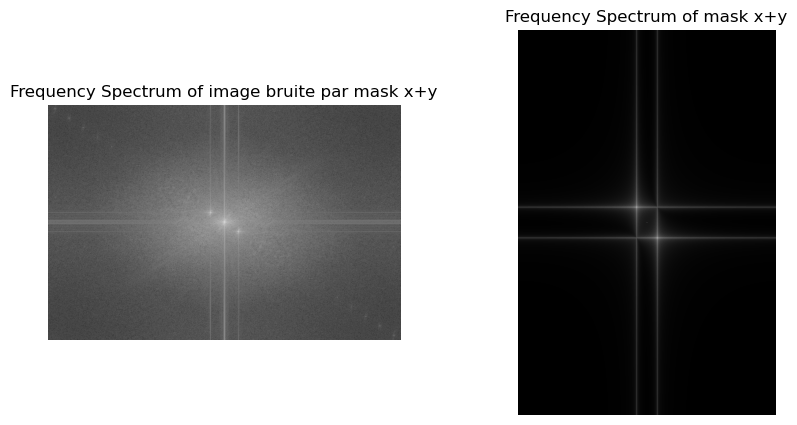

In [31]:
# calcule des spectres: pour l'image, and pour le mask 
#l'image
spectrum_image_xaddy = np.fft.fftshift(np.fft.fft2(noisy_image_xaddy))
amplitude_spectrum_image_xaddy= np.log(np.abs(spectrum_image_xaddy) + 1)

#le mask 
spectrum_mask_xaddy = np.fft.fftshift(np.fft.fft2(mask_xaddy))
amplitude_spectrum_mask_xaddy= np.log(np.abs(spectrum_mask_xaddy) + 1)

# affichage des spectres
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(amplitude_spectrum_image_xaddy, cmap='gray')
plt.title("Frequency Spectrum of image bruite par mask x+y")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(amplitude_spectrum_mask_xaddy, cmap='gray')
plt.title("Frequency Spectrum of mask x+y")
plt.axis("off")

plt.show()


*coment*: mask_xy combines periodicity from both X and Y axes, creating diagonal stripes with a crosshatch or grid-like appearance. This mask introduces diagonal patterns and lead to cross-pattern noise

In [32]:
P=25
X, Y = np.meshgrid(x, y)
mask_xsqrty= a*(1+np.cos(2*np.pi*(X*X+Y*Y)/P))/2 +offset

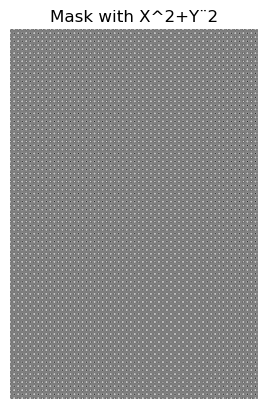

In [33]:
# affichage du mask 
plt.imshow(mask_xsqrty, cmap='gray') 
plt.title("Mask with X^2+Y¨2")
plt.axis("off") 
plt.show()

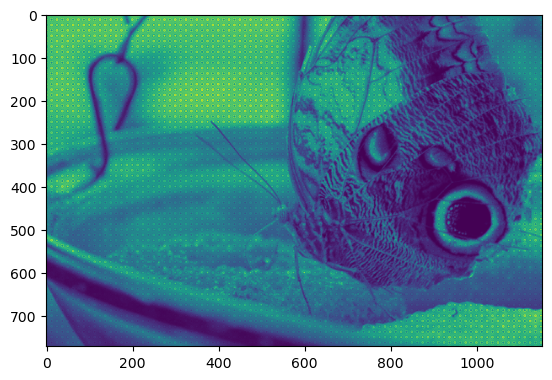

In [34]:
#generation d'image bruité mar le mask x+y
noisy_image_xsqrty = (np.array(gray_image)*mask_xsqrty.T).astype(np.uint8)
plt.imshow(noisy_image_xsqrty)

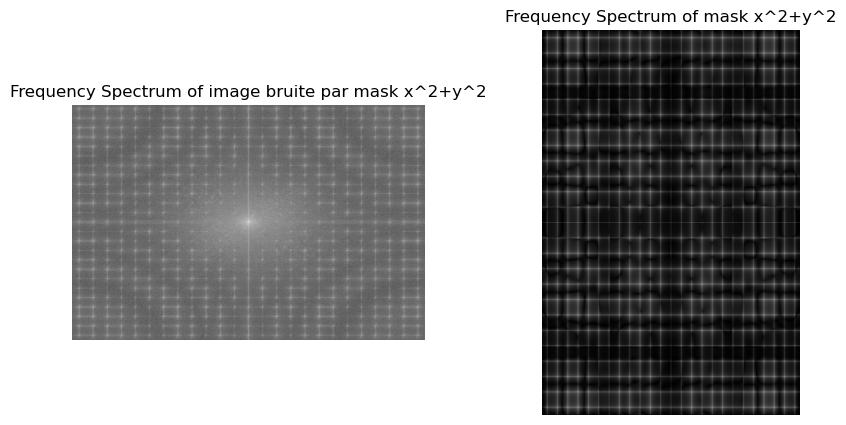

In [35]:
# calcule des spectres: pour l'image, and pour le mask 
#l'image
spectrum_image_xsqrty = np.fft.fftshift(np.fft.fft2(noisy_image_xsqrty))
amplitude_spectrum_image_xsqrty= np.log(np.abs(spectrum_image_xsqrty) + 1)

#le mask 
spectrum_mask_xsqrty = np.fft.fftshift(np.fft.fft2(mask_xsqrty))
amplitude_spectrum_mask_xsqrty= np.log(np.abs(spectrum_mask_xsqrty) + 1)

# affichage des spectres
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(amplitude_spectrum_image_xsqrty, cmap='gray')
plt.title("Frequency Spectrum of image bruite par mask x^2+y^2")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(amplitude_spectrum_mask_xsqrty, cmap='gray')
plt.title("Frequency Spectrum of mask x^2+y^2")
plt.axis("off")

plt.show()


*comment*: mask_xsqrty creates a radial pattern due to its squared relationship between X and Y resulting in concentric circles or waves

# Image Denoising 
##  introduction: 
    dans cette partie du TP nous allons nous focaliser sur la mise en place des alogorithms de restauration des images bruites en utilisant par les approches linéaires dans le domaine spatial et spectral 

## Restauration des images altérées pad de bruit additinnel 

### Suppression du Bruit Impulsionnel (Salt & pepper)

In [36]:
def blur_noisy_image ( image , kernel ):
    N,M = image.size
    picf = np.zeros((M,N))
    for i in range(M):
        picf[i,:] = np.convolve(np.asarray(image)[i,:], kernel, "same")
    for j in range(N):
        picf[:,j] = np.convolve(picf[:,j], kernel, "same")
    img = picf.astype('uint8')
    snr = psnr(np.asarray(image), img)
    return Image.fromarray(img) , snr

#### denoising the blured image with salt noise 

In [37]:
kernel = 1/7*np.ones(7)
picture, R= blur_noisy_image ( blured_salt_img , kernel )

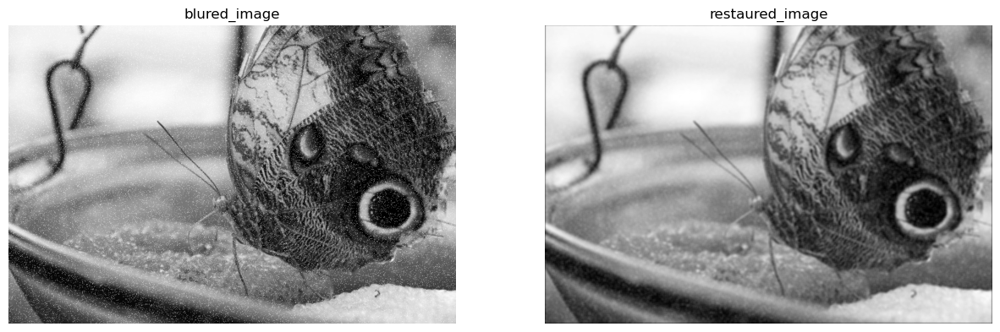

In [38]:
# Displaying the images with differentimpulsionnel noise 
fig, axes = plt.subplots(1, 2, figsize=(15, 5))  

titles = ["blured_image", "restaured_image"]
images = [blured_salt_img, picture]

for ax, title, image in zip(axes, titles, images):
    ax.imshow(image, cmap='gray')
    ax.set_title(title) 
    ax.axis('off') 
    
plt.show()  


#### Etudiant l'effet de la taille dyu noyau du filtre et de la densité du bruit sur la qaulité de restauration 

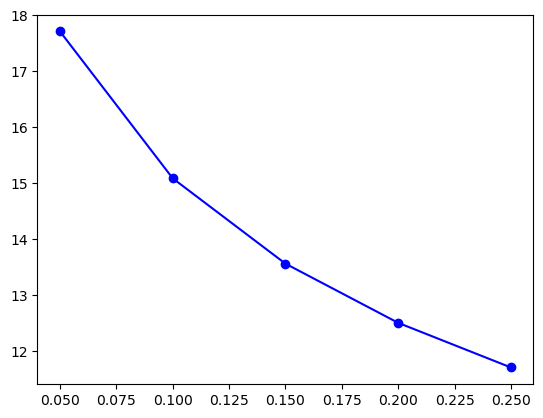

In [39]:
#l'effet de la densité du bruit  sur la restauration
psnr_arry = []
for d in [0.05,0.1,0.15,0.2,0.25]:
    kern = np.ones(7)/7
    noisy = imnoise(gray_image,'s&p',d)
    _ , val = blur_noisy_image( noisy , kern )
    psnr_arry.append(val)
    
plt.plot([0.05,0.1,0.15,0.2,0.25], psnr_arry, marker='o', linestyle='-', color='b')

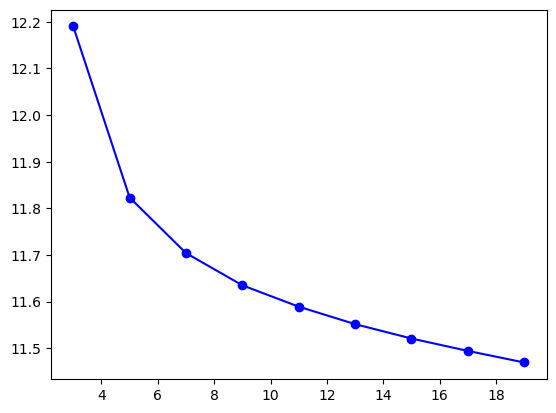

In [40]:
#l'effet de la taille du noyau du filtre sur la restauration 
psnr_arry = []
for dim in range(3,21,2):
    kern = np.ones(dim)/dim
    val = blur_noisy_image ( noisy , kern )[1]
    psnr_arry.append(val)
    
plt.plot(range(3,21,2), psnr_arry, marker='o', linestyle='-', color='b')

### Supression du bruit Gaussien dans le domaine spatiale 

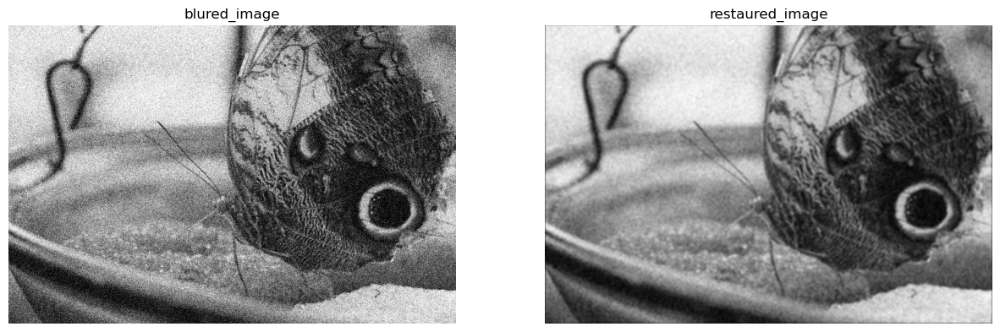

In [41]:
#kernel = 1/7*np.ones(7)
gauss, R_gauss= blur_noisy_image ( blured_img_gauss[2] , kernel )
# Displaying the images with differentimpulsionnel noise 
fig, axes = plt.subplots(1, 2, figsize=(15, 5))  

titles = ["blured_image", "restaured_image"]
images = [blured_img_gauss[2], gauss ]

for ax, title, image in zip(axes, titles, images):
    ax.imshow(image, cmap='gray')
    ax.set_title(title) 
    ax.axis('off') 
    
plt.show()  



In [42]:
R_gauss

15.004185289561365

#### Etudiant l'effet de la taille dyu noyau du filtre et de la densité du bruit sur la qaulité de restauration 

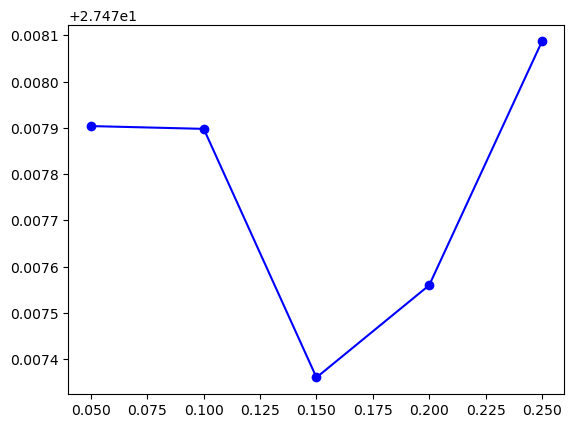

In [43]:
#l'effet de la densité du bruit  sur la restauration
psnr_arry = []
for d in [0.05,0.1,0.15,0.2,0.25]:
    kern = np.ones(7)/7
    noisy_gauss = imnoise(gray_image,'gaussian',d)
    _ , val = blur_noisy_image( noisy_gauss , kern )
    psnr_arry.append(val)
    
plt.plot([0.05,0.1,0.15,0.2,0.25], psnr_arry,  marker='o', linestyle='-', color='b')

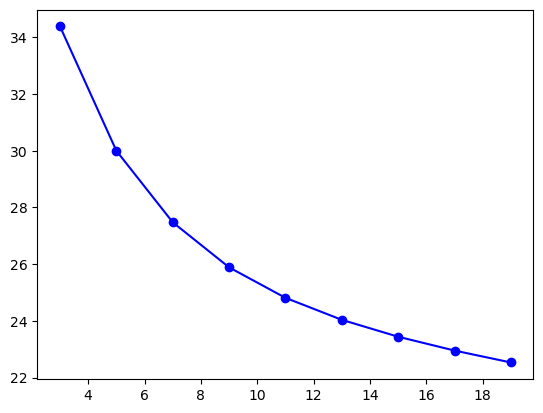

In [44]:
#l'effet de la taille du noyau du filtre sur la restauration 
psnr_arry = []
for dim in range(3,21,2):
    kern = np.ones(dim)/dim
    val = blur_noisy_image ( noisy_gauss , kern )[1]
    psnr_arry.append(val)
    
plt.plot(range(3,21,2), psnr_arry,  marker='o', linestyle='-', color='b')

### Supression du bruit impulsionnel dans le domaine spectrale 

###### Le spectre d'image bruitée 
    -> for this part we gonna use the salt& pepper noise 

In [45]:
def clacule_specter(image_array):
    fft_result = np.fft.fft2(image_array)
    fft_shifted = np.fft.fftshift(fft_result)
    amplitude = np.abs(fft_shifted)
    phase = np.angle(fft_shifted)
    return amplitude, phase

In [46]:
image_array = np.asarray(blured_sandp_img)

amplitude, phase = clacule_specter(image_array)

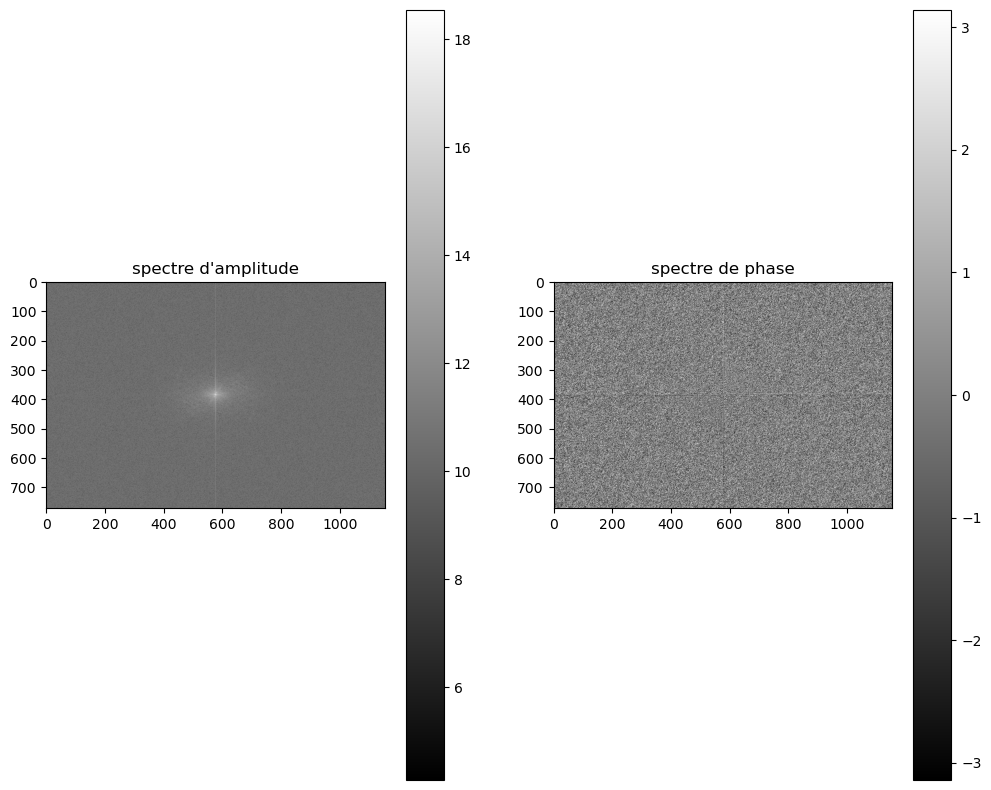

In [47]:

plt.figure(figsize=(12,10))

plt.subplot(1,2,1)
plt.title("spectre d'amplitude")
plt.imshow(np.log(1 + amplitude), cmap='gray')  
plt.colorbar()

plt.subplot(1, 2, 2)
plt.title("spectre de phase") ## similaire d'un bruit 
plt.imshow(phase, cmap='gray')  
plt.colorbar()

plt.show()



In [48]:
def gen_rectangle(xi, xf):
    x1, y1 = xi
    x2, y2 = xf
    return np.array([x1, x2, x2, x1, x1]), np.array([y1, y1, y2, y2, y1])

In [49]:
#defining un filtre a boite spectrale 

def generate_square_mask (shape, D): 
    mask = np.zeros(shape)
    center = (shape[0]//2, shape[1]//2)
    square_start = (center[0]-D//2, center[1] - D // 2)
    square_end = (center[0] + D // 2, center[1] + D // 2)
    
    mask[square_start[0]:square_end[0], square_start[1]:square_end[1]] = 1   # filtrage a boite spectrale 
    return mask

In [50]:
## aplying the mask on the amplitude spectrum 
#image_array = np.asarray(blured_sandp_img)
d= 50
#amplitude, phase = clacule_specter(image_array)
mask = generate_square_mask(amplitude.shape, d)


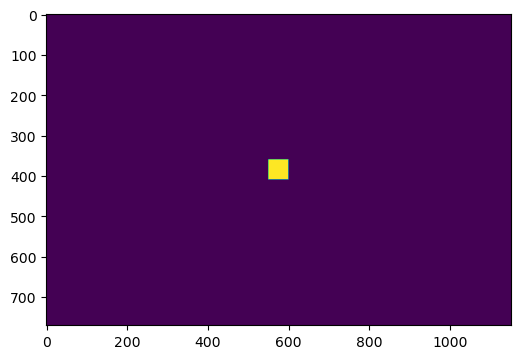

In [51]:
#plotting the filtre
plt.figure(figsize=(6, 6))
plt.imshow(mask) 

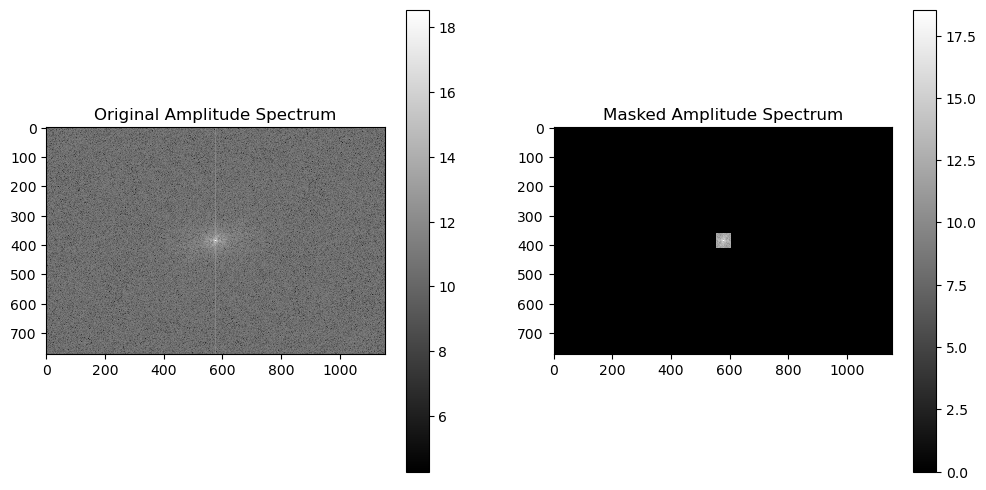

In [52]:
amplitude_masked = amplitude * mask

# Display the original amplitude spectrum and the masked amplitude spectrum
plt.figure(figsize=(12, 6))

# Original Amplitude Spectrum
plt.subplot(1, 2, 1)
plt.imshow(np.log(1 + amplitude), cmap='gray', interpolation='nearest')
plt.title("Original Amplitude Spectrum")
plt.colorbar()

# Masked Amplitude Spectrum
plt.subplot(1, 2, 2)
plt.imshow(np.log(1 + amplitude_masked), cmap='gray', interpolation='nearest')
plt.title("Masked Amplitude Spectrum")
plt.colorbar()

plt.show()

In [53]:
## implemting the reversed fourier tranformer to get the blurred image
def fourier_inverse(mask, amplitude , phase): 
    amplitude_masked = amplitude*mask 
    fft_masked = amplitude_masked * np.exp(1j*phase)
    
    ifft_result = np.fft.ifftshift(fft_masked)
    reconstructed_image = np.fft.ifft2(ifft_result)
    reconstructed_image = np.real( reconstructed_image)
    reconstructed_image= np.clip ( reconstructed_image, 0,255).astype(np.uint8)
    
    return  reconstructed_image
        

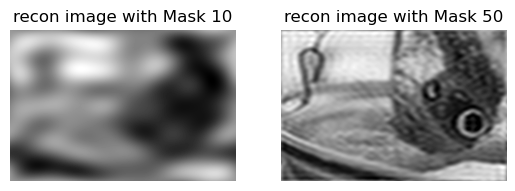

In [54]:
## generating two masks to compare the effect of mask size on the filtrage 
mask_10 = generate_square_mask(amplitude.shape, 10)
mask_50 = generate_square_mask(amplitude.shape, 50)

## aplying the ifft 

recon_image_10= fourier_inverse(mask_10, amplitude , phase)
recon_image_50= fourier_inverse(mask_50, amplitude , phase)

## displaying the image
plt.subplot(1, 2, 1) 
plt.imshow(recon_image_10, cmap='gray')  
plt.title("recon image with Mask 10")
plt.axis('off') 

plt.subplot(1, 2, 2)  
plt.imshow(recon_image_50, cmap='gray')  
plt.title("recon image with Mask 50")
plt.axis('off') 

plt.show() 

    -> plus que la taille de filtre a boite diminue plus qu'on laisse des basses frequeces passe ( le centre de spectre represente les basses frequences) et par consequence on augmente l'effet de Lissage.
    

In [55]:
## Calcule de PSNR 
#blured_sandp_img_np is image_array var
original_image_np = np.asarray(gray_image)
recon_image_50_np = np.asarray(recon_image_50)
P = psnr(original_image_np, recon_image_50_np)
P


21.89677837679408

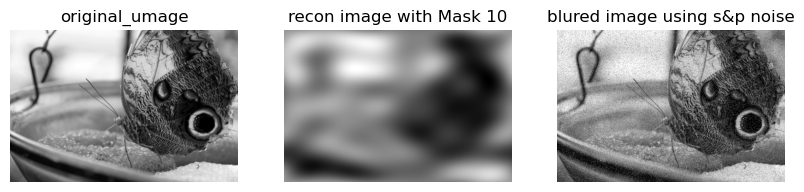

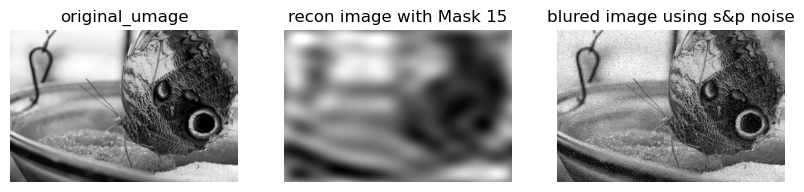

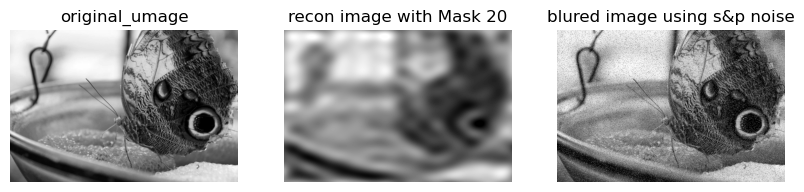

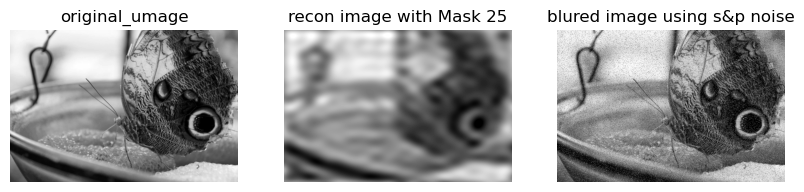

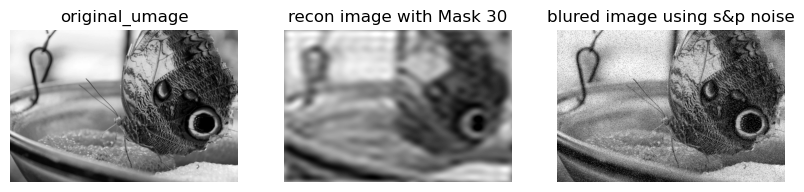

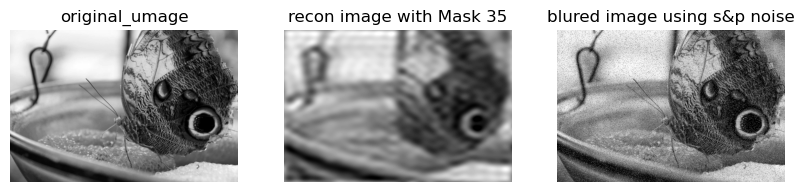

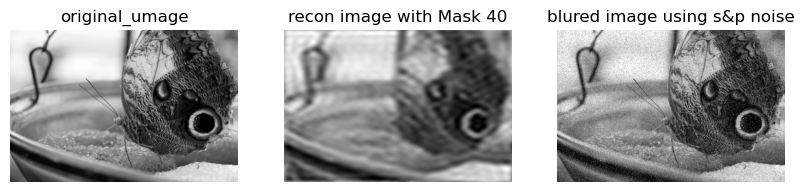

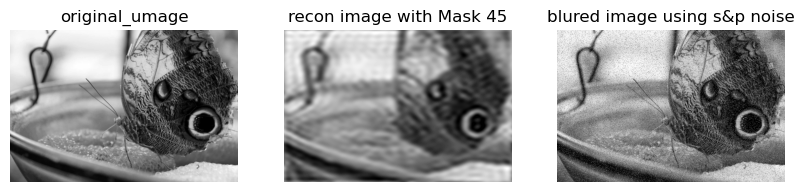

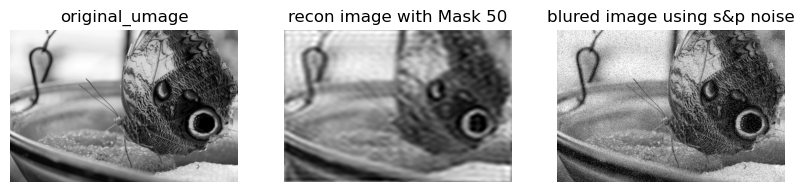

PSNR values for different mask sizes: [16.796915911550837, 17.95043359495315, 18.934044339909224, 19.4914658436086, 20.18843846624892, 20.547881431722605, 21.102162208113224, 21.470522562611166, 21.89677837679408]


In [56]:
# calculating the PSNR selon la taille du mask 

d = [10, 15, 20, 25, 30, 35, 40, 45, 50]
psnr_values = []

for size in d:
    mask = generate_square_mask(amplitude.shape, size)  # Generate the square mask
    recon_image = fourier_inverse(mask, amplitude, phase)  # Reconstruct the image
    recon_image = recon_image.astype('uint8')
    recon_image_np = np.asarray(recon_image)
    value = psnr(original_image_np, recon_image_np)
    psnr_values.append(value)
    ## displaying the images
    plt.figure(figsize=(10, 5))
    
    plt.subplot(1, 3, 1) 
    plt.imshow(original_image_np, cmap='gray')  
    plt.title("original_umage")
    plt.axis('off') 

    plt.subplot(1, 3, 2)  
    plt.imshow(recon_image, cmap='gray')  
    plt.title(f"recon image with Mask {size}")
    plt.axis('off') 
    
    plt.subplot(1, 3, 3)  
    plt.imshow(blured_sandp_img , cmap='gray')  
    plt.title("blured image using s&p noise")
    plt.axis('off')

    plt.show() 

print("PSNR values for different mask sizes:", psnr_values)



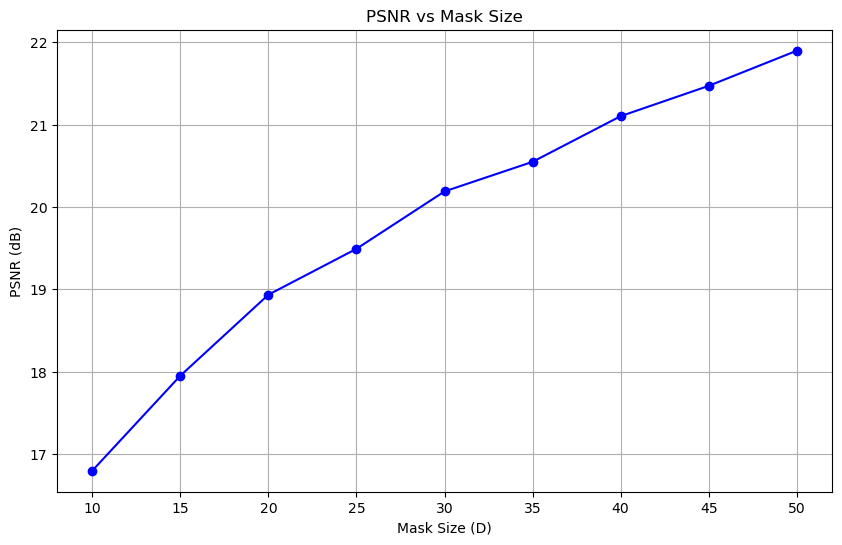

In [57]:
# ploting  the PSNR values to visualize the effect of mask size
plt.figure(figsize=(10, 6))
plt.plot(d, psnr_values, marker='o', linestyle='-', color='b')
plt.title("PSNR vs Mask Size")
plt.xlabel("Mask Size (D)")
plt.ylabel("PSNR (dB)")
plt.grid(True)
plt.show()

    -> we notice that larger mask sizes are generally lead to better image quality after spectral masking, and to better reconstruction results but at the same time the psnr increases

#####  now we gonna perform the image reconstruction but this time using a circular mask

        -> we gonna apply the circular mask this time on a salt blurred image. the image is in the variable :
        blured_salt_img

In [58]:
## creatuon d'un masque geometrique circulaire 
def create_circular_mask(shape, diameter): 
    h , w = shape
    center_x = w//2
    center_y= h//2
    r= diameter/2
    y, x = np.ogrid[:h,:w]
    mask= (x-center_x)**2+ (y-center_y)**2 <=r**2
    return mask 

In [59]:
## aplying the mask on the amplitude spectrum 
Image_Array = np.asarray(blured_sandp_img)
D= 100
Amplitude_cir, Phase_cir = clacule_specter(Image_Array)
circular_mask =create_circular_mask(Amplitude_cir.shape, D)


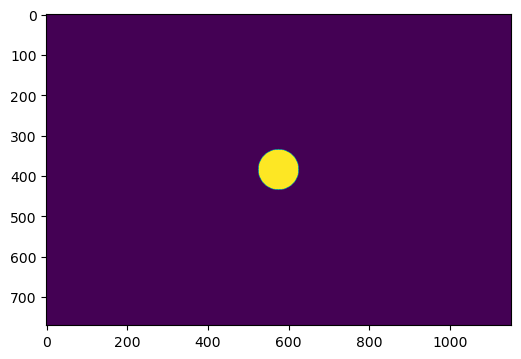

In [60]:
#plotting the filtre
plt.figure(figsize=(6, 6))
plt.imshow(circular_mask) 

In [61]:
Amplitude_masked_cir = Amplitude_cir * circular_mask

# Display the original amplitude spectrum and the masked amplitude spectrum
plt.figure(figsize=(12, 6))

# Original Amplitude Spectrum
plt.subplot(1, 2, 1)
plt.imshow(np.log(1 + Amplitude_cir), cmap='gray')
plt.title("Original Amplitude Spectrum")
plt.colorbar()

# Masked Amplitude Spectrum
plt.subplot(1, 2, 2)
plt.imshow(np.log(1 + Amplitude_masked)_cir, cmap='gray')
plt.title("Masked Amplitude Spectrum")
plt.colorbar()

plt.show()

SyntaxError: invalid syntax. Perhaps you forgot a comma? (3908110166.py, line 14)

In [ ]:
mask_c_20 =create_circular_mask(Amplitude_cir.shape, 20)
mask_c_100 = create_circular_mask(Amplitude_cir.shape, 100)

## aplying the ifft 

rec_image_20= fourier_inverse(mask_c_20, Amplitude_cir , Phase_cir)
rec_image_100= fourier_inverse(mask_c_100, Amplitude_cir , Phase_cir)

## displaying the image
plt.subplot(1, 2, 1) 
plt.imshow(rec_image_20, cmap='gray')  
plt.title("recon image with diametre 20")
plt.axis('off') 

plt.subplot(1, 2, 2)  
plt.imshow(rec_image_100, cmap='gray')  
plt.title("recon image with diametre 100")
plt.axis('off') 

plt.show()  

In [ ]:
# calculating the PSNR selon la taille du mask 

Diameter = [10, 15, 20, 25, 30, 35, 40, 45, 50]
psnr_cir_mask = []

for size in Diameter:
    mask_cir = create_circular_mask(Amplitude_cir.shape, size)  # Generate the square mask
    recon_image = fourier_inverse(mask_cir, Amplitude_cir, Phase_cir)  # Reconstruct the image
    recon_image = recon_image.astype('uint8')
    recon_image_np = np.asarray(recon_image)
    value = psnr(original_image_np, recon_image_np)
    psnr_cir_mask.append(value)
    ## displaying the images
     
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 3, 1) 
    plt.imshow(original_image_np, cmap='gray')  
    plt.title("original_umage")
    plt.axis('off') 

    plt.subplot(1, 3, 2)  
    plt.imshow(recon_image, cmap='gray')  
    plt.title(f"recon image with Mask {size}")
    plt.axis('off') 
    
    plt.subplot(1, 3, 3)  
    plt.imshow(blured_sandp_img , cmap='gray')  
    plt.title("blured image using s&p noise")
    plt.axis('off')

    plt.show() 

print("PSNR values for different mask sizes:", psnr_cir_mask)



In [ ]:
# ploting  the PSNR values to visualize the effect of mask size
plt.figure(figsize=(10, 6))
plt.plot(Diameter, psnr_cir_mask, marker='o', linestyle='-', color='r')
plt.title("PSNR vs Mask Size")
plt.xlabel("Mask diameter (D)")
plt.ylabel("PSNR (dB)")
plt.grid(True)
plt.show()

In [ ]:
#affichaeg d'une image reconstruit par un square mask et une autre reconstruit par un circular mask
## displaying the image of a circular mask 
plt.subplot(1, 2, 1) 
plt.imshow(rec_image_100, cmap='gray')  
plt.title("recon image with a circular mask ")
plt.axis('off') 

## displaying the image of a square mask 
plt.subplot(1, 2, 2)  
plt.imshow(recon_image_50, cmap='gray')  
plt.title("recon image with a square Mask")
plt.axis('off') 

plt.show() 


    -> we notice that the circular mask is better for creating smooth transitions than the square one this due to shape of the mask. a circulat mask navigate the image and define each pixel as the center of a cercle with diameter d leads to a softer and more natural boundry compared to the square mask that defines a square arounf the selected pixel leading to a better definitions of  edges and corners 

#### The Butterworth mask (low passs)
**The filter**:
<img src="butterfilter.png" style="width:600px;height:300px;">


In [ ]:
def butterworth_low_pass_filter(shape, DO, n):
    rows, cols = shape
    crow, ccol = rows // 2, cols // 2
    X, Y = np.ogrid[:rows, :cols]
    distance = np.sqrt((X - crow) ** 2 + (Y - ccol) ** 2)
    F = 1 / (1 + (distance / DO) ** (2 * n))
    return F

In [ ]:
## aplying the mask on the amplitude spectrum 
Img_Array = np.asarray(blured_sandp_img)
D= 100
n=2
Amplitude_butter, Phase_butter = clacule_specter(Img_Array)
butterfilter =butterworth_low_pass_filter(Amplitude_butter.shape, D, n)

In [ ]:
#plotting the filtre
plt.figure(figsize=(6, 6))
plt.imshow(butterfilter) 

In [ ]:
Amplitude_butter_masked = Amplitude_butter * butterfilter

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(np.log(1 + Amplitude_butter), cmap='gray', interpolation='nearest')
plt.title("Original Amplitude Spectrum")
plt.colorbar()

plt.subplot(1, 2, 2)
plt.imshow(np.log(1 + Amplitude_butter_masked), cmap='gray', interpolation='nearest')
plt.title("Masked Amplitude Spectrum")
plt.colorbar()

plt.show()

In [ ]:
# illustrer les resultats 

In [ ]:
D0 = 25 
n = [2, 4, 6, 8]  
psnr_butter_sandp = []

for order in n:
    mask_butter = butterworth_low_pass_filter(Amplitude_butter.shape, D0, order)  
    recon_image = fourier_inverse(mask_butter, Amplitude_butter, Phase_butter) 
    recon_image = recon_image.astype('uint8')  

    value = psnr(original_image_np, np.array(recon_image))
    psnr_butter_sandp .append(value)  

    # ploting the images 
    plt.figure(figsize=(10, 5))
    
    plt.subplot(1, 3, 1) 
    plt.imshow(original_image_np, cmap='gray')
    plt.title("Original Image")
    plt.axis('off')

    plt.subplot(1, 3, 2)  # reconstructed image with butter mask
    plt.imshow(recon_image, cmap='gray')
    plt.title(f"Reconstructed (Order {order})")
    plt.axis('off')

    plt.subplot(1, 3, 3)  # blurred image 
    plt.imshow(blured_sandp_img, cmap='gray')
    plt.title("Blurred Image (S&P Noise)")
    plt.axis('off')  

    plt.show()  


print("PSNR values for different filter orders:", psnr_butter_sandp )

In [ ]:
plt.figure(figsize=(8, 6))
plt.plot(n, psnr_butter_sandp , '-o', color='r', label='PSNR')
plt.title("Effect of Butterworth Filter Order on PSNR")
plt.xlabel("Order of the Butterworth Filter")
plt.ylabel("PSNR (dB)")
plt.grid(True)
plt.show()

### Supression du bruit gaussian dans le domaine spectrale 

steps : 
* le calcule du spectre de l'image bruitée par le bruit guassian 
* masque géometrique carrée 
    * appliquation du masque es illustration des varaitions de psnr en fonction de la taiile du masque 
* masque géométrique circulair 
    * appliquation du masque es illustration des varaitions de psnr en fonction du diametre du masque 
* masque butterworth 
    * appliquation du masque es illustration des varaitions de psnr en fonction d'order du masque 

* **image bruitée**: blured_img_gauss[2] par une var= 50
* **calcule du spectre**: clacule_specter(image_array) return Amp_gauss, phase_gauss
* **application du masque carré**: mask = generate_square_mask(amplitude.shape, d)
* **application du mask circulaire**: circular_mask =create_circular_mask(Amplitude.shape, D)
* **application du mask butterworth** : circular_mask =create_circular_mask(Amplitude.shape, D)

In [ ]:
blr_image= blured_img_gauss[2]
blr_image_np= np.asarray (blr_image)
#blr_image

In [ ]:
amp_gauss , phase_gauss = clacule_specter(blr_image_np) 
# affichage du spectre en amlitude et en phase 

plt.figure(figsize=(12,10))

plt.subplot(1,2,1)
plt.title("spectre d'amplitude")
plt.imshow(np.log(1 + amplitude), cmap='gray')  
plt.colorbar()

plt.subplot(1, 2, 2)
plt.title("spectre de phase") ## similaire d'un bruit 
plt.imshow(phase, cmap='gray')  
plt.colorbar()

plt.show()


In [ ]:
#applying the squared mask 
d = [10, 15, 20, 25, 30, 35, 40, 45, 50]
psnr_square_gauss = []

# Loop over different square mask sizes and calculate PSNR
for size in d:
    s_mask = generate_square_mask(amp_gauss.shape, size)  # Generate the square mask
    recon_image = fourier_inverse(s_mask, amp_gauss, phase_gauss)  # Reconstruct the image
    recon_image = recon_image.astype('uint8')
    recon_image_np = np.asarray(recon_image)

    value = psnr(original_image_np, recon_image_np)  # Calculate PSNR
    psnr_square_gauss.append(value)

    ## displaying the images
    plt.figure(figsize=(15, 7))
    
    plt.subplot(1, 3, 1) 
    plt.imshow(original_image_np, cmap='gray')  
    plt.title("Original Image")
    plt.axis('off') 

    plt.subplot(1, 3, 2)  
    plt.imshow(recon_image, cmap='gray')  
    plt.title(f"Reconstructed Image with Mask {size}")
    plt.axis('off') 
    
    plt.subplot(1, 3, 3)  
    plt.imshow(blr_image_np, cmap='gray')  
    plt.title("Blurred Image using Gaussian Noise")
    plt.axis('off')

    plt.show() 

print("PSNR values for different square mask sizes:", psnr_square_gauss)

In [ ]:
plt.figure(figsize=(8, 6))
plt.plot(d,psnr_square_gauss, '-o', color='r', label='PSNR')
plt.title("Effect of size on PSNR")
plt.xlabel("size of square")
plt.ylabel("PSNR (dB)")
plt.grid(True)
plt.show()

In [ ]:
#applying the circular mask 

Diameter = [10, 15, 20, 25, 30, 35, 40, 45, 50]
psnr_circular_gauss = []

for size in Diameter:
    c_mask = create_circular_mask(amp_gauss.shape, size)  # Generate the square mask
    recon_image = fourier_inverse(c_mask, amp_gauss, phase_gauss)  # Reconstruct the image
    recon_image = recon_image.astype('uint8')
    recon_image_np = np.asarray(recon_image)
    value = psnr(original_image_np, recon_image_np)
    psnr_circular_gauss.append(value)
    ## displaying the images
     
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 3, 1) 
    plt.imshow(original_image_np, cmap='gray')  
    plt.title("original_umage")
    plt.axis('off') 

    plt.subplot(1, 3, 2)  
    plt.imshow(recon_image, cmap='gray')  
    plt.title(f"recon image with Mask {size}")
    plt.axis('off') 
    
    plt.subplot(1, 3, 3)  
    plt.imshow(blr_image , cmap='gray')  
    plt.title("blured image using gaussian noise")
    plt.axis('off')

    plt.show() 

print("PSNR values for different mask sizes:", psnr_circular_gauss)


In [ ]:
plt.figure(figsize=(8, 6))
plt.plot(Diameter,psnr_circular_gauss, '-o', color='r', label='PSNR')
plt.title("Effect of size on PSNR")
plt.xlabel("diameter")
plt.ylabel("PSNR (dB)")
plt.grid(True)
plt.show()

In [ ]:
#applying thebutterworth filter
D0 = 25 
n = [2, 4, 6, 8]  
psnr_butter_guass = []

for order in n:
    mask_butter = butterworth_low_pass_filter(amp_gauss.shape, D0, order)  
    recon_image = fourier_inverse(mask_butter, amp_gauss, phase_gauss) 
    recon_image = recon_image.astype('uint8')  

    value = psnr(original_image_np, np.array(recon_image))
    psnr_butter_guass.append(value)  

    # ploting the images 
    plt.figure(figsize=(10, 5))
    
    plt.subplot(1, 3, 1) 
    plt.imshow(original_image_np, cmap='gray')
    plt.title("Original Image")
    plt.axis('off')

    plt.subplot(1, 3, 2)  # reconstructed image with butter mask
    plt.imshow(recon_image, cmap='gray')
    plt.title(f"Reconstructed (Order {order})")
    plt.axis('off')

    plt.subplot(1, 3, 3)  # blurred image 
    plt.imshow(blr_image, cmap='gray')
    plt.title("Blurred Image (S&P Noise)")
    plt.axis('off')  

    plt.show()  


print("PSNR values for different filter orders:", psnr_butter_guass )


In [ ]:
plt.figure(figsize=(8, 6))
plt.plot(n,psnr_butter_guass, '-o', color='r', label='PSNR')
plt.title("Effect of size on PSNR")
plt.xlabel("n")
plt.ylabel("PSNR (dB)")
plt.grid(True)
plt.show()

*comment* : gaussian is a type of continous noise with normal distribution that creates a grainy effect with random variations in pixel values which can lead to a smoother but less sharp image. implusive noise intriduces discrete high-cintrast spots this approach retains sharpness but may leave localized artifacts if the noise is intense.

### Supression du bruit périodique dans le domaine spectrale 

In [ ]:
p=5
mask_x_y = 0.5 * (1 + np.cos(2 * np.pi * (x[:, None] + y) / P)) / 2  
noisy_image = (original_image_np * mask_x_y).astype(np.uint8)  
plt.imshow(noisy_image)

In [ ]:
dft_noisy = np.fft.fftshift(np.fft.fft2(noisy_image))
amplitude_spectrum = np.log(np.abs(dft_noisy) + 1)  

plt.imshow(amplitude_spectrum, cmap='gray')
plt.title("Amplitude Spectrum of Noisy Image")
plt.axis("off")
plt.show()